<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Food Contents for Nutrition Classification

Overview
- The intake of food contents reflects the individual	health statuses per the quality and quantity of the foods. Food is composed of wide range of complex substances that provides significant cell growth and development. Particularly, the content of the essential nutrients and the safety of the food are the most important components to benefits our need.

- The objective of the project is to address the classification of the safe and quality food based on their macro and micro-nutrients to investigate the health status of the consumers.??????


The data sourced from : https://corgis-edu.github.io/corgis/csv/food/


## 1 Load the Dataset

### 1.1 Importing Libraries

In [149]:
# Numerical manipulation libraries
import pandas as pd
import numpy as np
import missingno
import statsmodels.api as sm

# plotting tools
import seaborn as sns
import matplotlib.pyplot as plt

In [100]:
df = pd.read_csv('./data/food.csv')
df.head(3)

,Category,Description,Nutrient Data Bank Number,Data.Alpha Carotene,Data.Ash,Data.Beta Carotene,Data.Beta Cryptoxanthin,Data.Carbohydrate,Data.Cholesterol,Data.Choline,...,Data.Major Minerals.Potassium,Data.Major Minerals.Sodium,Data.Major Minerals.Zinc,Data.Vitamins.Vitamin A - IU,Data.Vitamins.Vitamin A - RAE,Data.Vitamins.Vitamin B12,Data.Vitamins.Vitamin B6,Data.Vitamins.Vitamin C,Data.Vitamins.Vitamin E,Data.Vitamins.Vitamin K
0,BUTTER,"BUTTER,WITH SALT",1001,0,2.11,158,0,0.06,215,19,...,24,576,0.09,2499,684,0.17,0.003,0.0,2.32,7.0
1,BUTTER,"BUTTER,WHIPPED,WITH SALT",1002,0,2.11,158,0,0.06,219,19,...,26,827,0.05,2499,684,0.13,0.003,0.0,2.32,7.0
2,BUTTER OIL,"BUTTER OIL,ANHYDROUS",1003,0,0.00,193,0,0.00,256,22,...,5,2,0.01,3069,840,0.01,0.001,0.0,2.80,8.6


In [101]:
# Check the shape of the datasets
df.shape

(7413, 48)

## 2  Data Cleaning and EDA 

Check the missed values and values of the data that helps to manage the redundant missed values and to looking the statistics summary of the overall dataset. These steps aimed to make the data to be cleaned and ready for modeling.

### 2.1 Identify Missed Values

In [102]:
df_copy = df.copy(deep=True) # to keep the original train data with coping.
df_copy.shape

(7413, 48)

Two columns of house weight description have missed values in the dataframe. House Weight 2nd 42% missed value and House Weight 1st with 6.34% from the tota share.

In [103]:
# look the data type of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7413 entries, 0 to 7412
Data columns (total 48 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Category                                                 7413 non-null   object 
 1   Description                                              7413 non-null   object 
 2   Nutrient Data Bank Number                                7413 non-null   int64  
 3   Data.Alpha Carotene                                      7413 non-null   int64  
 4   Data.Ash                                                 7413 non-null   float64
 5   Data.Beta Carotene                                       7413 non-null   int64  
 6   Data.Beta Cryptoxanthin                                  7413 non-null   int64  
 7   Data.Carbohydrate                                        7413 non-null   float64
 8   Data.Cholesterol            

In [104]:
# remove special character
df.columns = df.columns.str.replace('[.]',   '_')

<ipython-input-104-b08cac56807f>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df.columns = df.columns.str.replace('[.]',   '_')


In [105]:
# look the data type of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7413 entries, 0 to 7412
Data columns (total 48 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Category                                                 7413 non-null   object 
 1   Description                                              7413 non-null   object 
 2   Nutrient Data Bank Number                                7413 non-null   int64  
 3   Data_Alpha Carotene                                      7413 non-null   int64  
 4   Data_Ash                                                 7413 non-null   float64
 5   Data_Beta Carotene                                       7413 non-null   int64  
 6   Data_Beta Cryptoxanthin                                  7413 non-null   int64  
 7   Data_Carbohydrate                                        7413 non-null   float64
 8   Data_Cholesterol            

In [106]:
# Drop the first three column for renaming the others together
df1=df.drop(columns =['Category', 'Description', 'Nutrient Data Bank Number'])
df1

,Data_Alpha Carotene,Data_Ash,Data_Beta Carotene,Data_Beta Cryptoxanthin,Data_Carbohydrate,Data_Cholesterol,Data_Choline,Data_Fiber,Data_Kilocalories,Data_Lutein and Zeaxanthin,...,Data_Major Minerals_Potassium,Data_Major Minerals_Sodium,Data_Major Minerals_Zinc,Data_Vitamins_Vitamin A - IU,Data_Vitamins_Vitamin A - RAE,Data_Vitamins_Vitamin B12,Data_Vitamins_Vitamin B6,Data_Vitamins_Vitamin C,Data_Vitamins_Vitamin E,Data_Vitamins_Vitamin K
0,0,2.11,158,0,0.06,215,19,0.0,717,0,...,24,576,0.09,2499,684,0.17,0.003,0.0,2.32,7.0
1,0,2.11,158,0,0.06,219,19,0.0,717,0,...,26,827,0.05,2499,684,0.13,0.003,0.0,2.32,7.0
2,0,0.00,193,0,0.00,256,22,0.0,876,0,...,5,2,0.01,3069,840,0.01,0.001,0.0,2.80,8.6
3,0,5.11,74,0,2.34,75,15,0.0,353,0,...,256,1395,2.66,763,198,1.22,0.166,0.0,0.25,2.4
4,0,3.18,76,0,2.79,94,15,0.0,371,0,...,136,560,2.60,1080,292,1.26,0.065,0.0,0.26,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,0,1.40,0,0,0.00,50,65,0.0,73,0,...,285,58,1.00,50,15,0.40,0.120,0.0,1.00,0.1
7409,0,13.40,0,0,0.00,95,95,0.0,305,0,...,520,4450,1.10,157,47,12.00,0.410,0.0,2.38,7.8
7410,0,3.06,0,0,0.00,53,81,0.0,112,0,...,476,265,3.00,100,30,1.30,0.100,0.0,1.50,0.2
7411,0,1.30,0,0,2.00,50,65,0.0,90,0,...,382,70,1.00,100,30,0.50,0.130,0.0,5.00,0.1


Let's look at missed values in Household Weighs2nd Household Weigh escripion and Household Weighs1s Household Weigh escripion feature in details. 

In [121]:
# Check the missed data values assending order
df.isnull().sum().sort_values(ascending=False).head()

Category                      0
Description                   0
Data_Fat_Polysaturated Fat    0
Data_Fat_Saturated Fat        0
Data_Fat_Total Lipid          0
dtype: int64

In [122]:
df['Data_Household Weights_1st Household Weight Description'].unique()

array(['1 cup', '1 oz', '1 cup, diced', '1 cup, melted', '4 oz',
       '1 cup,  (not packed)', '1 cup, crumbled', '1 cup, shredded',
       '1 cup,  whipped', '1 container,  individual', '1.5 oz', '1 fl oz',
       '1 cup,  (8 fl oz)', '1 container,  (8 oz)',
       '1 cup,  (4.86 large eggs)', '.5 lb', '1 large', '1 cup, chopped',
       '1 tbsp', '1 cup,  sifted', '1 egg', '.35 oz', '2 tbsp', '1 slice',
       '1 container,  (4.4 oz)', '1 8 oz container,  (8 oz)',
       '1 tbsp, whole', '1 tsp, leaves', '1 tbsp, crumbled',
       '1 tbsp, ground', '1 tsp', '2 tbsp, chopped', '1 cup, sprigs',
       '1 tsp,  or 1 packet', '1 tbsp,  drained', '1 stick',
       '1 jar,  Beech-Nut Stage 2 (4 oz)', '1 jar,  Gerber (4 oz)',
       '.5 oz', '1 cookie', '1 cracker', '1 serving', '1 scoop',
       '1 Serving, 100 ml', '1 serving, 100 ml', '3 scoop',
       '1 tablespoon', '1 tbsp,  (1 NLEA serving)',
       '1 spray, , about 1/3 second (1 NLEA serving)',
       '1 tablespoon,  (1 NLEA servi

In [124]:
df['Data_Household Weights_2nd Household Weight Description'].unique()

array(['1 tbsp', '1 cubic inch', '1 cup, shredded', '1 cup, sliced',
       '1 oz', '3 oz', '1 cup, melted', '1 cup, large curd (not packed)',
       '4 oz', '1 package,  (7 oz)', '1 package,  (8 oz)',
       '1 package,  (3 oz)', '.5 cup', '5 package,  (5 oz)',
       '1 package,  (6 oz)', '1 cup',
       '1 cup, fluid (yields 2 cups whipped)', '1 fl oz', '1 quart',
       '1 tsp', '1 portion,  amount to make 1 tbsp', '.25 cup',
       '1 envelope,  (1-1/3 cup)', '.25 lb', '1 container,  (10.6 oz)',
       '1 container,  (11 oz)', '1 container,  (8 oz)',
       '1 container,  (4.4 oz)', '1 container,  (6 oz)',
       '.5 container,  (4 oz)', '1 extra large', '1 large', '.7 oz',
       '1 jar,  (5 oz)', '2 tbsp', '1 cup,  (8 fl oz)', '1 tsp, whole',
       '1 tbsp, leaves', '1 tsp, crumbled', '1 tsp, ground', '5 leaves',
       '5 sprigs', '.5 tsp', '2 leaves', '1 serving', '1 jar',
       '1 container', '1 piece', '1 jar,  Gerber First Foods (2.5 oz)',
       '1 jar,  Gerber', '1 jar,

In [111]:
# Separate numberic feature 
df_numerics = ['int64', 'float64']
df_numerics = df.select_dtypes(include=df_numerics).columns.tolist()
df_numerics

['Nutrient Data Bank Number',
 'Data_Alpha Carotene',
 'Data_Ash',
 'Data_Beta Carotene',
 'Data_Beta Cryptoxanthin',
 'Data_Carbohydrate',
 'Data_Cholesterol',
 'Data_Choline',
 'Data_Fiber',
 'Data_Kilocalories',
 'Data_Lutein and Zeaxanthin',
 'Data_Lycopene',
 'Data_Manganese',
 'Data_Niacin',
 'Data_Pantothenic Acid',
 'Data_Protein',
 'Data_Refuse Percentage',
 'Data_Retinol',
 'Data_Riboflavin',
 'Data_Selenium',
 'Data_Sugar Total',
 'Data_Thiamin',
 'Data_Water',
 'Data_Fat_Monosaturated Fat',
 'Data_Fat_Polysaturated Fat',
 'Data_Fat_Saturated Fat',
 'Data_Fat_Total Lipid',
 'Data_Household Weights_1st Household Weight',
 'Data_Household Weights_2nd Household Weight',
 'Data_Major Minerals_Calcium',
 'Data_Major Minerals_Copper',
 'Data_Major Minerals_Iron',
 'Data_Major Minerals_Magnesium',
 'Data_Major Minerals_Phosphorus',
 'Data_Major Minerals_Potassium',
 'Data_Major Minerals_Sodium',
 'Data_Major Minerals_Zinc',
 'Data_Vitamins_Vitamin A - IU',
 'Data_Vitamins_Vitamin A

In [136]:
df['Nutrient Data Bank Number'].unique()

array([ 1001,  1002,  1003, ..., 90240, 90560, 93600], dtype=int64)

In [133]:
df['Nutrient Data Bank Number'].value_counts(normalize=True)

16384    0.000135
11032    0.000135
17173    0.000135
19220    0.000135
11024    0.000135
           ...   
5312     0.000135
9406     0.000135
1210     0.000135
5304     0.000135
18431    0.000135
Name: Nutrient Data Bank Number, Length: 7413, dtype: float64

In [134]:
df['Nutrient Data Bank Number'].value_counts(normalize=True)

16384    0.000135
11032    0.000135
17173    0.000135
19220    0.000135
11024    0.000135
           ...   
5312     0.000135
9406     0.000135
1210     0.000135
5304     0.000135
18431    0.000135
Name: Nutrient Data Bank Number, Length: 7413, dtype: float64

In [112]:
# List of common catagorcal columns in the cleaded train df.
df_catagorical = df.select_dtypes(include=['object']).columns.tolist()
df_catagorical

['Category',
 'Description',
 'Data_Household Weights_1st Household Weight Description',
 'Data_Household Weights_2nd Household Weight Description']

In [118]:
# Create a function to perform filling of the missed values
def get_clean(df, nan_to_mode_cols):
    
    # Replace NaN to mode
    for col in nan_to_mode_cols:
        
        df[col].fillna(df[col].mode()[0], inplace=True)
    
    return (df)

In [127]:
df_filled= get_clean(df, df_catagorical)
df_filled.head(2)

,Category,Description,Nutrient Data Bank Number,Data_Alpha Carotene,Data_Ash,Data_Beta Carotene,Data_Beta Cryptoxanthin,Data_Carbohydrate,Data_Cholesterol,Data_Choline,...,Data_Major Minerals_Potassium,Data_Major Minerals_Sodium,Data_Major Minerals_Zinc,Data_Vitamins_Vitamin A - IU,Data_Vitamins_Vitamin A - RAE,Data_Vitamins_Vitamin B12,Data_Vitamins_Vitamin B6,Data_Vitamins_Vitamin C,Data_Vitamins_Vitamin E,Data_Vitamins_Vitamin K
0,BUTTER,"BUTTER,WITH SALT",1001,0,2.11,158,0,0.06,215,19,...,24,576,0.09,2499,684,0.17,0.003,0.0,2.32,7.0
1,BUTTER,"BUTTER,WHIPPED,WITH SALT",1002,0,2.11,158,0,0.06,219,19,...,26,827,0.05,2499,684,0.13,0.003,0.0,2.32,7.0


In [131]:
# Check the missed data values already filled by mode values
df.isnull().sum().sort_values(ascending=False).head(12)

Category                                                   0
Description                                                0
Data_Fat_Polysaturated Fat                                 0
Data_Fat_Saturated Fat                                     0
Data_Fat_Total Lipid                                       0
Data_Household Weights_1st Household Weight                0
Data_Household Weights_1st Household Weight Description    0
Data_Household Weights_2nd Household Weight                0
Data_Household Weights_2nd Household Weight Description    0
Data_Major Minerals_Calcium                                0
Data_Major Minerals_Copper                                 0
Data_Major Minerals_Iron                                   0
dtype: int64

### 2.2 Examine Numeric Features

In [132]:
# Create the default pairplot
sns.pairplot(df)

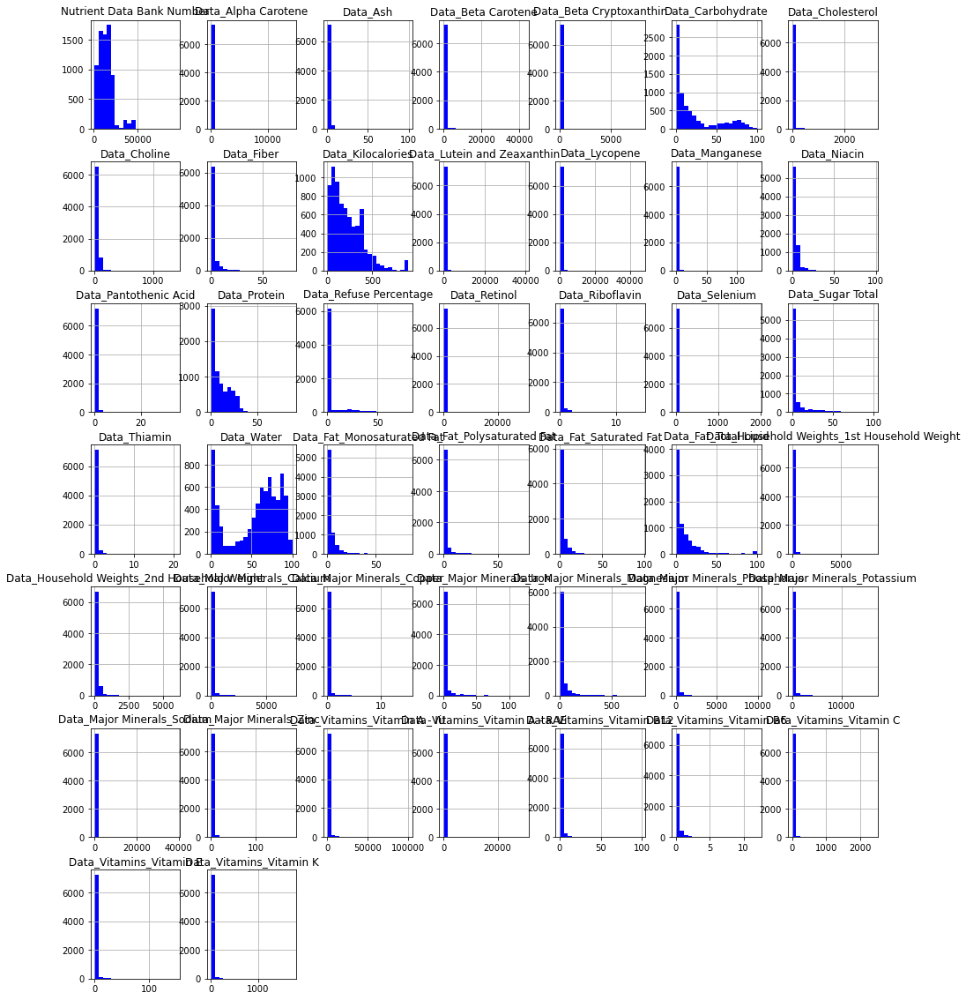

In [137]:
# Plot histograms for the numerical data for further preprocessing specifc numeric column
df.select_dtypes(['int64', 'float']).hist(figsize=(16, 20), bins=20, color='blue');

<AxesSubplot:>

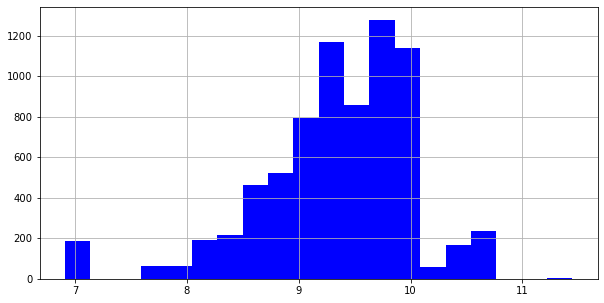

In [143]:
# Examining the individual "Numeric features
gg = np.log(df['Nutrient Data Bank Number'])
gg.hist(figsize=(10, 5), bins=20, color='blue')

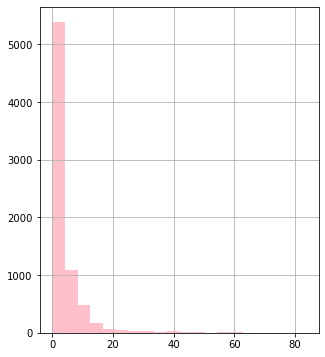

In [157]:
# Examining the individual numeric features to see the distribution
df['Data_Fat_Monosaturated Fat'].hist(figsize=(5, 6), bins=20, color='pink');

### 2.4 Analyzing duplicated records

In [163]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7408    False
7409    False
7410    False
7411    False
7412    False
Length: 7413, dtype: bool

In [164]:
df[df['Data_Sugar Total'].duplicated()].head()

,Category,Description,Nutrient Data Bank Number,Data_Alpha Carotene,Data_Ash,Data_Beta Carotene,Data_Beta Cryptoxanthin,Data_Carbohydrate,Data_Cholesterol,Data_Choline,...,Data_Major Minerals_Potassium,Data_Major Minerals_Sodium,Data_Major Minerals_Zinc,Data_Vitamins_Vitamin A - IU,Data_Vitamins_Vitamin A - RAE,Data_Vitamins_Vitamin B12,Data_Vitamins_Vitamin B6,Data_Vitamins_Vitamin C,Data_Vitamins_Vitamin E,Data_Vitamins_Vitamin K
1,BUTTER,"BUTTER,WHIPPED,WITH SALT",1002,0,2.11,158,0,0.06,219,19,...,26,827,0.05,2499,684,0.13,0.003,0.0,2.32,7.0
7,CHEESE,"CHEESE,CARAWAY",1008,0,3.28,0,0,3.06,93,0,...,93,690,2.94,1054,271,0.27,0.074,0.0,0.00,0.0
9,CHEESE,"CHEESE,CHESHIRE",1010,0,3.60,0,0,4.78,103,0,...,95,700,2.79,985,233,0.83,0.074,0.0,0.00,0.0
10,CHEESE,"CHEESE,COLBY",1011,0,3.36,82,0,2.57,95,15,...,127,604,3.07,994,264,0.83,0.079,0.0,0.28,2.7
20,CHEESE,"CHEESE,GJETOST",1021,0,4.75,0,0,42.65,94,0,...,1409,600,1.14,1113,334,2.42,0.271,0.0,0.00,0.0


###  2.5 Exploratory Data Analysis

In [165]:
# To check statistical values 
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Nutrient Data Bank Number,7413.0,14116.443680,8767.416214,1001.0,8121.000,12539.000,18424.000,93600.000000
Data_Alpha Carotene,7413.0,21.210711,269.714183,0.0,0.000,0.000,0.000,14251.000000
Data_Ash,7413.0,1.852459,2.993228,0.0,0.830,1.240,2.200,99.800000
Data_Beta Carotene,7413.0,159.043437,1126.285026,0.0,0.000,0.000,1.000,42891.000000
Data_Beta Cryptoxanthin,7413.0,8.776744,154.184860,0.0,0.000,0.000,0.000,7923.000000
Data_Carbohydrate,7413.0,21.785381,27.123491,0.0,0.490,9.290,30.590,100.000000
Data_Cholesterol,7413.0,37.162822,119.738438,0.0,0.000,2.000,60.000,3100.000000
Data_Choline,7413.0,20.673546,45.481990,0.0,0.000,0.000,20.000,1388.000000
Data_Fiber,7413.0,1.993147,4.292873,0.0,0.000,0.300,2.300,79.000000
Data_Kilocalories,7413.0,219.655875,171.668713,0.0,82.000,181.000,331.000,902.000000


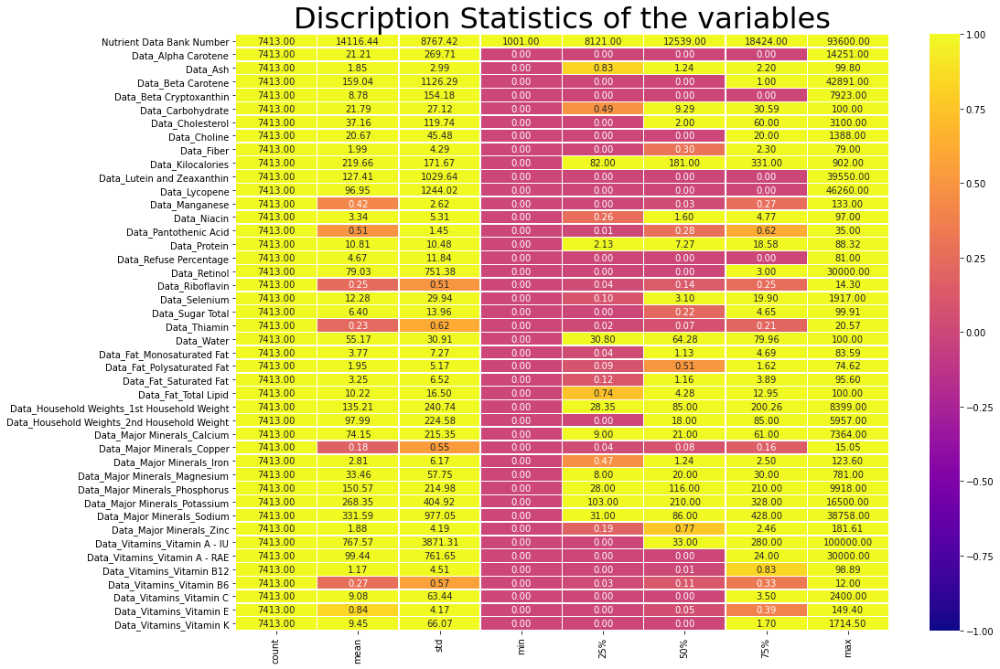

In [168]:
plt.figure(figsize=(16,12))
sns.heatmap(df.describe().T,annot=True, fmt='.2f',linewidths=.5, vmin=-1, vmax=1,cmap='plasma')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.axis('tight')
plt.title('Discription Statistics of the variables',fontsize=32);

###  2.6 Features correlation

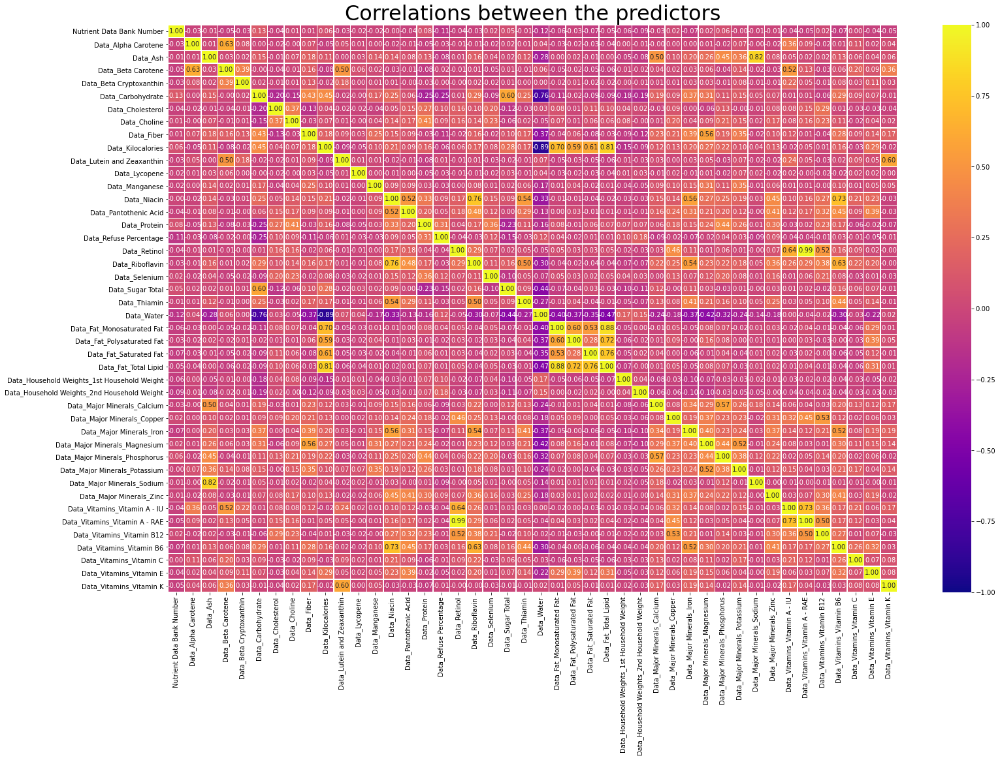

In [184]:
df2=df.select_dtypes(['int64', 'float']).corr()
plt.figure(figsize=(25,16))
sns.heatmap(df2,annot=True, fmt='.2f',linewidths=.5, vmin=-1, vmax=1,cmap='plasma')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.axis('tight')
plt.title('Correlations between the predictors',fontsize=32);

The majority data is not strong correlation between the features as seen from the above figure.

It is possiblw to make some feature engineering on highly positive and negative correlated like "Ash" and "'Data_Major Minerals_Sodium", "Kilocalories" and "Total lipid", "Retinola" and "Vitamin A" , "Kilocalories" and "Water", "Carbohydrate" and "Water", "Monosaturated Fat" and "Kilocalories", and "Niacine" and "Vitamin B6"

Now let's see the correlations of the predictors with target variable.

In [186]:
# Let's see the correlations of the predictors with the assume target variable 
df2.corr()['Data_Household Weights_1st Household Weight'].sort_values(ascending=False)

Data_Household Weights_1st Household Weight    1.000000
Data_Water                                     0.478177
Data_Refuse Percentage                         0.300291
Data_Household Weights_2nd Household Weight    0.209544
Data_Cholesterol                               0.145995
Data_Choline                                   0.139558
Data_Protein                                   0.097547
Data_Selenium                                  0.075725
Data_Lycopene                                  0.029773
Data_Alpha Carotene                           -0.010887
Data_Lutein and Zeaxanthin                    -0.021700
Data_Beta Carotene                            -0.037744
Data_Beta Cryptoxanthin                       -0.038444
Data_Vitamins_Vitamin B12                     -0.059657
Data_Retinol                                  -0.089523
Data_Vitamins_Vitamin K                       -0.095141
Data_Vitamins_Vitamin A - RAE                 -0.096671
Data_Major Minerals_Sodium                    -0

In [187]:
# Let's see the correlations of the predictors with the assume target variable 
df2.corr()['Data_Household Weights_2nd Household Weight'].sort_values(ascending=False)

Data_Household Weights_2nd Household Weight    1.000000
Data_Refuse Percentage                         0.417067
Data_Water                                     0.414489
Data_Household Weights_1st Household Weight    0.209544
Data_Cholesterol                               0.115113
Data_Protein                                   0.084328
Data_Selenium                                  0.055388
Data_Lycopene                                  0.045358
Data_Choline                                   0.005865
Data_Fat_Saturated Fat                        -0.002863
Data_Fat_Monosaturated Fat                    -0.034956
Data_Alpha Carotene                           -0.044514
Data_Fat_Total Lipid                          -0.048713
Data_Beta Cryptoxanthin                       -0.058635
Data_Lutein and Zeaxanthin                    -0.061835
Data_Beta Carotene                            -0.075927
Data_Vitamins_Vitamin B12                     -0.094943
Data_Fat_Polysaturated Fat                    -0